##Setting Up The YOLOv5 Environment 🚀

In [3]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -U -r yolov5/requirements.txt  # install dependencies

fatal: destination path 'yolov5' already exists and is not an empty directory.
     |████████████████████████████████| 11.2 MB 12.6 MB/s 
     |████████████████████████████████| 60.5 MB 45.6 MB/s 
     |████████████████████████████████| 4.3 MB 35.2 MB/s 
     |████████████████████████████████| 596 kB 22.1 MB/s 
     |████████████████████████████████| 63 kB 1.4 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
     |████████████████████████████████| 750.6 MB 10 kB/s 
     |████████████████████████████████| 21.0 MB 11.6 MB/s 
     |████████████████████████████████| 76 kB 5.3 MB/s 
     |████████████████████████████████| 899 kB 49.1 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
  Attempting uninstall: tor

In [1]:
#installing for google colab GPU use
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |█████████████                   | 834.1 MB 1.7 MB/s eta 0:11:48tcmalloc: large alloc 1147494400 bytes == 0x563718b92000 @  0x7f4dd9058615 0x5636de86717c 0x5636de94747a 0x5636de869f9d 0x5636de95bd4d 0x5636de8ddec8 0x5636de8d8a2e 0x5636de86b88a 0x5636de8ddd30 0x5636de8d8a2e 0x5636de86b88a 0x5636de8da719 0x5636de95cb76 0x5636de8d9d95 0x5636de95cb76 0x5636de8d9d95 0x5636de95cb76 0x5636de8d9d95 0x5636de86bce9 0x5636de8af579 0x5636de86a902 0x5636de8ddc4d 0x5636de8d8a2e 0x5636de86b88a 0x5636de8da719 0x5636de8d8a2e 0x5636de86b88a 0x5636de8d98f6 0x5636de86b7aa 0x5636de8d9b4f 0x5636de8d8a2e
     |████████████████▌               | 1055.7 MB 1.5 MB/s eta 0:10:50tcmalloc: large alloc 1434370048 bytes == 0x56375d1e8000 @  0x7f4dd9058615 0x5636de86717c 0x5636de94747a 0x5636de869f9d 0x5636de95bd4d 0x5636de8ddec8 0x5636de8d8a2e 0x5636de86b88a 0x5636de8ddd30 0x5636de8d8a2e 0x5636de86b88a 0x5636de8da719 0x5636de95cb76 0x5636de8d9d

In [2]:
%cd /content/yolov5

/content/yolov5


In [ ]:
import torch
from IPython.display import Image  # for displaying images

print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.9.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


### Downloading the data

In [3]:
# You need to sign up in roboflow to get the key and then you can use the dataset
!curl -L "LINK" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1402      0 --:--:-- --:--:-- --:--:--  1400
100 14.2M  100 14.2M    0     0  8730k      0  0:00:01  0:00:01 --:--:--  237M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/images---2022-03-31T121809-125_jpg.rf.ef3cee437038ff927078d28876308429.jpg  
 extracting: test/images/images---2022-03-31T121839-918_jpg.rf.42c2aed62e0462ef6f130e742a86e2e6.jpg  
 extracting: test/images/images---2022-03-31T122132-525_jpg.rf.fd57c63f028f77ce9501d762031f88f9.jpg  
 extracting: test/images/images---2022-03-31T122138-241_jpg.rf.bc592641266bb745111ae195724f91cb.jpg  
 extracting: test/images/images---2022-03-31T122212-264_jpg.rf.3070b87980624c5c885705d7fde1824

The dataset got downloaded inside the yolov5 folder. 

Path to train dataset - /content/yolov5/train 

Path to test dataset - /content/yolov5/test

## Define Model Configuration and Architecture

In [4]:
%cat data.yaml


train: ../train/images
val: ../valid/images

nc: 2
names: ['Mc Donald-s', 'Mercedes']

Path to the train and test dataset is not correct. We need to edit it in the next steps

In [5]:
# define number of classes based on YAML
# data.yaml contains the information about number of classes and their labels required for this project
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [6]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [8]:
# Below we are changing the data configuration for right path to the dataset
%%writetemplate /content/yolov5/data.yaml

train: ./train/images
val: ./valid/images

nc: 2
names: ['Mc Donald-s', 'Mercedes']

In [9]:
#Let's check the data.yaml file for confirmation

%cat data.yaml


train: ./train/images
val: ./valid/images

nc: 2
names: ['Mc Donald-s', 'Mercedes']

In [10]:
with open(r'data.yaml') as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    labels_list = yaml.load(file, Loader=yaml.FullLoader)

    label_names = labels_list['names']

In [11]:
print("Number of Classes are {}, whose labels are {} for this Object Detection project".format(num_classes,label_names))

Number of Classes are 2, whose labels are ['Mc Donald-s', 'Mercedes'] for this Object Detection project


In [12]:
%cat /content/yolov5/models/yolov5n.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.25  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [13]:
# Below we are changing the configuration so that it becomes compatible to number of classes required in this project
%%writetemplate /content/yolov5/models/custom_yolov5n.yaml

# parameters
nc: {num_classes}  # number of classes  # CHANGED HERE
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.25  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## Train Custom YOLOv5 Detector

### Next, we'll fire off training!¶
Here, we are able to pass a number of arguments:

* **img:** define input image size
* **batch:** determine batch size
* **epochs:** define the number of training epochs. 
* **data:** set the path to our yaml file
* **cfg:** specify our model configuration
* **weights:** specify a custom path to weights. 
* **name:** result names
* **nosave:** only save the final checkpoint
* **cache:** cache images for faster training





In [14]:
import os
os.chdir('/content/yolov5')

In [17]:
# train yolov5s on Aquarium object detection data for 100 epochs [aroung 1000 epochs for better training and result]
# NOTE: All the images are already pre-processed to 416 x 416 size.
# We will be training for 100 epoch (increase it for better result) with batch size of 80
# data.yaml also contains the information about location of Train and Validation Data. That's how you get the train data.
# the training also requires the configuration of neural network, which is in custom_yolov5s.yaml
# weights will be by-default stored at /content/yolov5/runs/exp2/weights/best.pt
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 400 --batch 10 --epochs 30 --data './data.yaml' --cfg ./models/custom_yolov5n.yaml --weights '/content/yolov5/runs/train/exp/weights/best.pt'

/content/yolov5
train: weights=/content/yolov5/runs/train/exp/weights/best.pt, cfg=./models/custom_yolov5n.yaml, data=./data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=10, imgsz=400, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-76-gc94736a torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamm

## Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`

In [19]:
# Start tensorboard
# Launch after you have started training to all the graphs needed for inspection
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

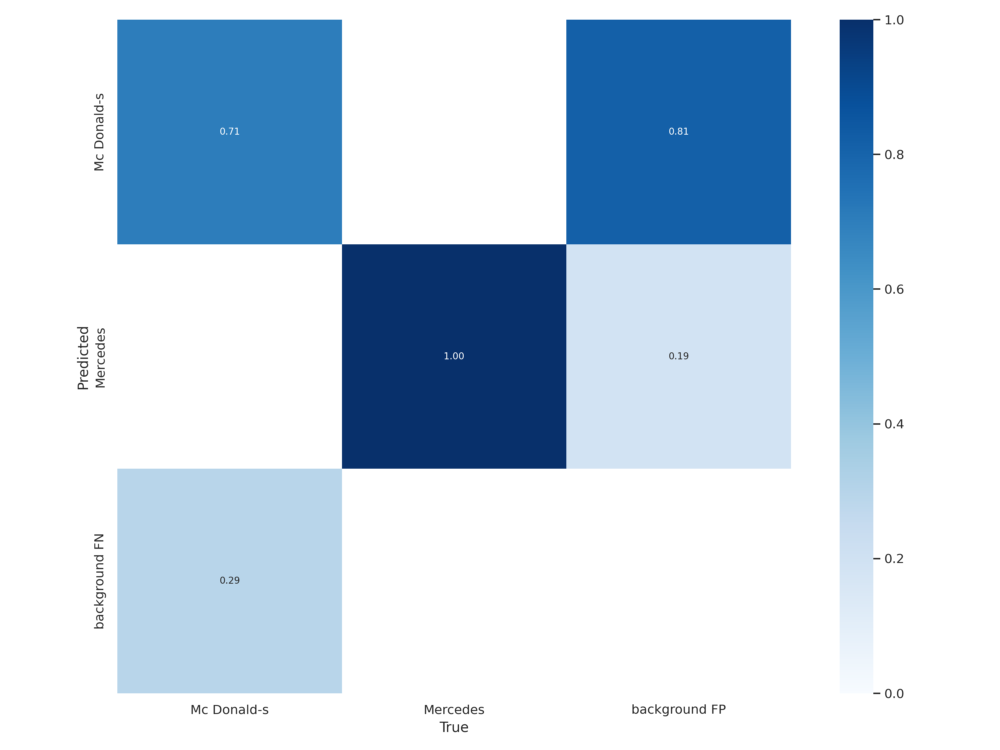

In [20]:
#confusion matrix
from PIL import *
Image.open('/content/yolov5/runs/train/exp2/confusion_matrix.png')

## Curious? Visualize Our Training Data with Labels
After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4.](https://arxiv.org/abs/2004.10934)



GROUND TRUTH TRAINING DATA:


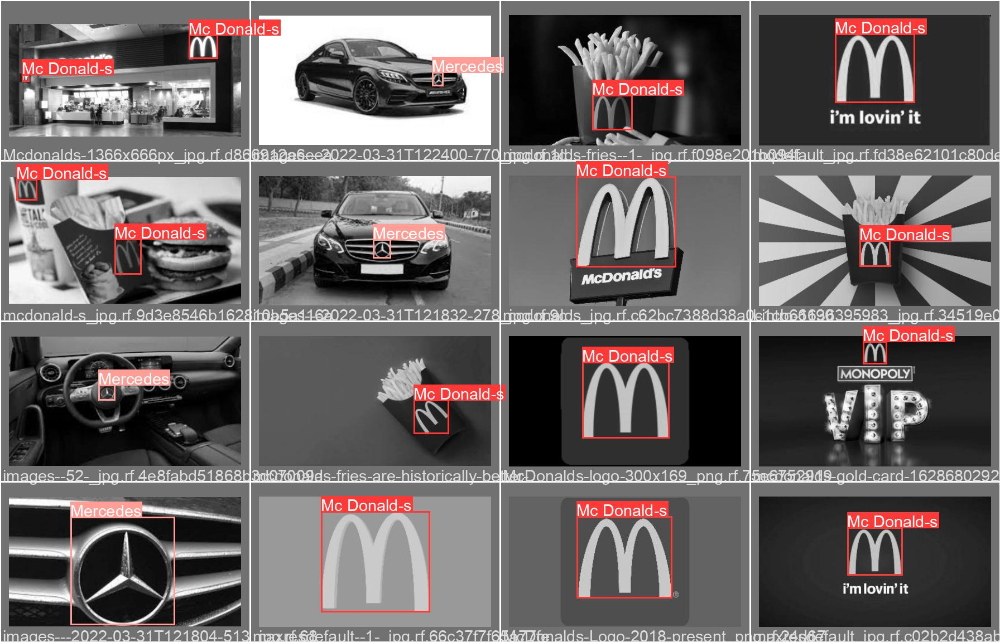

In [21]:
# first, display our ground truth data
# The ground truth [Train data] is available in jpg file at location /content/yolov5/runs/train/exp2/test_batch0_labels.jpg 
print("GROUND TRUTH TRAINING DATA:")
Image.open('/content/yolov5/runs/train/exp2/val_batch0_labels.jpg')

GROUND TRUTH AUGMENTED TRAINING DATA:


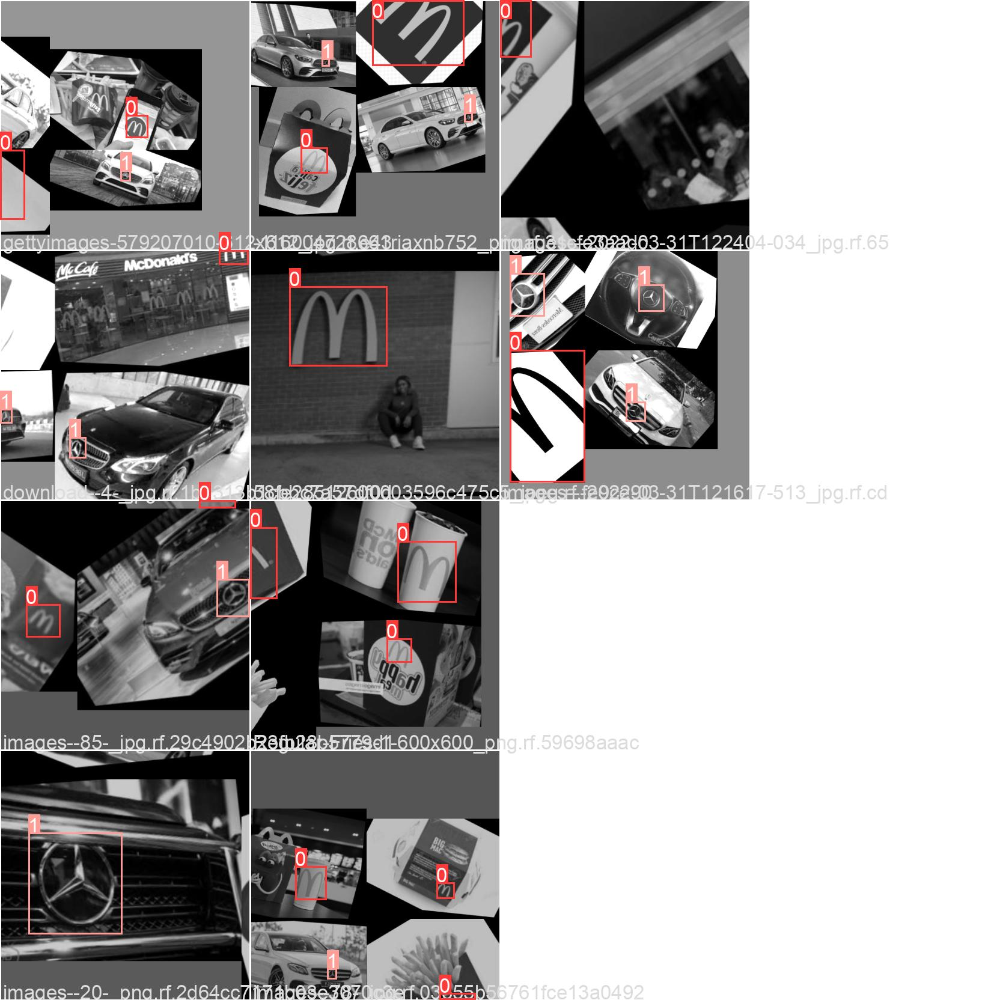

In [22]:
# print out an augmented training example
# Below is the augmented training data.
# NOTE: The dataset already contains the augmented data with annotations, so that you dont have to do it.
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image.open('/content/yolov5/runs/train/exp2/train_batch0.jpg')

# Run Inference With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [23]:
# use the best weights!
# Final weights will be by-default stored at /content/yolov5/runs/train/exp2/weights/best.pt
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --img 400 --conf 0.5 --source ./test/images

/content/yolov5
detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=./test/images, data=data/coco128.yaml, imgsz=[400, 400], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-76-gc94736a torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
custom_YOLOv5n summary: 213 layers, 1761871 parameters, 0 gradients, 4.2 GFLOPs
image 1/23 /content/yolov5/test/images/images---2022-03-31T121809-125_jpg.rf.ef3cee437038ff927078d28876308429.jpg: 320x416 1 Mercedes, Done. (0.014s)
image 2/23 /content/yolov5/test/images/images---2022-03-31T121839-918_jpg.rf.42c2aed62e0462ef6f130e742a86e2e6.jpg: 256x416 1 Mercedes, Done. (0.014s)
image 3/23 /content/yolov5/test/images/im

### Let's check the output

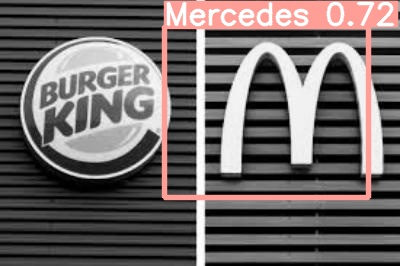

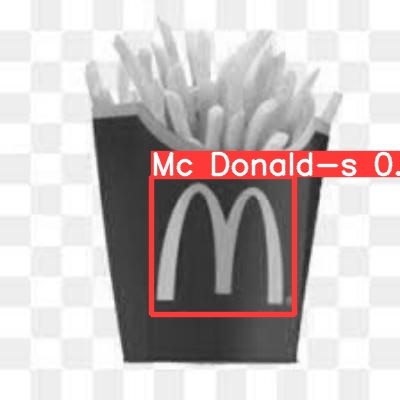

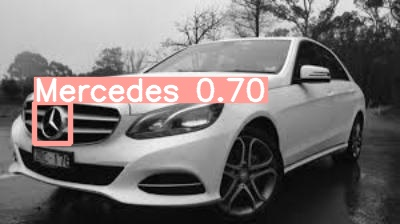

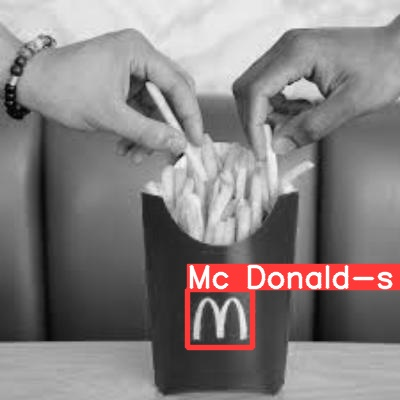

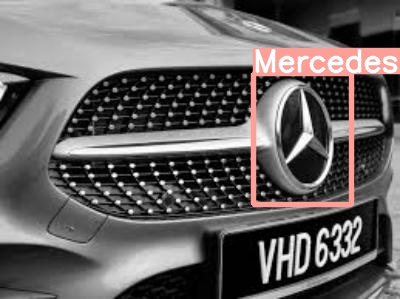

...

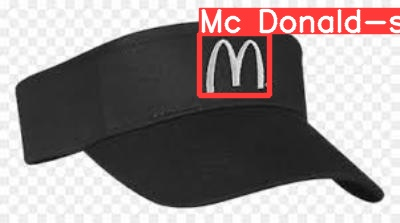

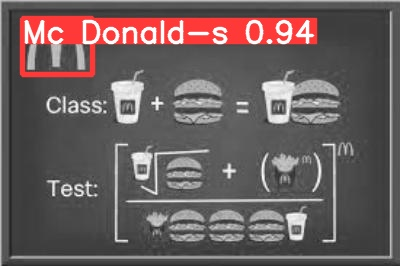

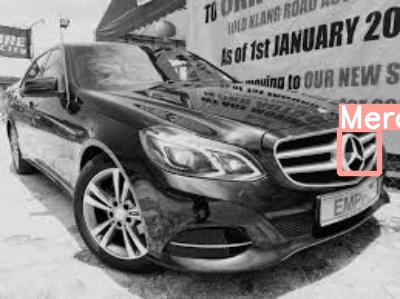

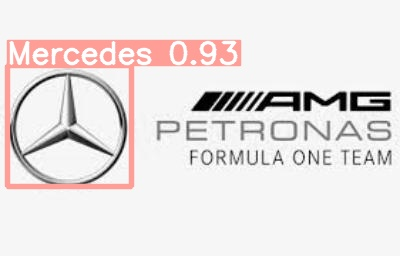

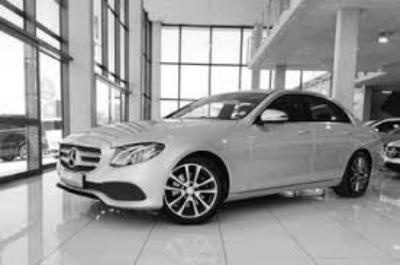

In [24]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## Export Trained Weights for Future Inference
Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [26]:
from google.colab import drive
drive.mount('/content/gdrive')

%cp /content/yolov5/runs/train/exp2/weights/best.pt /content/gdrive/MyDrive/

Mounted at /content/gdrive


In [27]:
#run detection on video

%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --conf-thres=0.7 --iou-thres=0.5 --source '/content/gdrive/MyDrive/vids/mcd.mp4'

/content/yolov5
detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=/content/gdrive/MyDrive/vids/mcd.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.7, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-76-gc94736a torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
custom_YOLOv5n summary: 213 layers, 1761871 parameters, 0 gradients, 4.2 GFLOPs
video 1/1 (1/720) /content/gdrive/MyDrive/vids/mcd.mp4: 384x640 Done. (0.016s)
video 1/1 (2/720) /content/gdrive/MyDrive/vids/mcd.mp4: 384x640 Done. (0.016s)
video 1/1 (3/720) /content/gdrive/MyDrive/vids/mcd.mp4: 384x640 Done. (0.016s)
video 1/1 (4/720) /content/gdrive/MyDrive/vids/mcd.mp4: 384x640 Done. (0.016s)
vid

In [28]:
#run detection on video

%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --conf-thres=0.5 --iou-thres=0.5 --source "/content/gdrive/MyDrive/vids/Ayam Goreng McD™ – There's Nothing Like It.mp4"

/content/yolov5
detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=/content/gdrive/MyDrive/vids/Ayam Goreng McD™ – There's Nothing Like It.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-76-gc94736a torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
custom_YOLOv5n summary: 213 layers, 1761871 parameters, 0 gradients, 4.2 GFLOPs
video 1/1 (1/754) /content/gdrive/MyDrive/vids/Ayam Goreng McD™ – There's Nothing Like It.mp4: 384x640 1 Mc Donald-s, Done. (0.017s)
video 1/1 (2/754) /content/gdrive/MyDrive/vids/Ayam Goreng McD™ – There's Nothing Like It.mp4: 384x640 1 Mc Donald-s, Done. (0.017s)
video 1/1 (3/7

In [29]:
#run detection on video

%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --conf-thres=0.5 --iou-thres=0.5 --source "/content/gdrive/MyDrive/vids/mercedes c class.mp4"

/content/yolov5
detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=/content/gdrive/MyDrive/vids/mercedes c class.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-76-gc94736a torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
custom_YOLOv5n summary: 213 layers, 1761871 parameters, 0 gradients, 4.2 GFLOPs
video 1/1 (1/3038) /content/gdrive/MyDrive/vids/mercedes c class.mp4: 384x640 Done. (0.016s)
video 1/1 (2/3038) /content/gdrive/MyDrive/vids/mercedes c class.mp4: 384x640 Done. (0.016s)
video 1/1 (3/3038) /content/gdrive/MyDrive/vids/mercedes c class.mp4: 384x640 Done. (0.016s)
video 1/1 (4/3038) /content

Prediction with exported weight (but you have to clone the yolov5 repo to use the detect.py)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#run detection on video

%cd /content/yolov5/
!python detect.py --weights /content/gdrive/MyDrive/mcd.pt --conf-thres=0.5 --iou-thres=0.5 --source "/content/gdrive/MyDrive/vids/Ayam Goreng McD™ – There's Nothing Like It.mp4"

/content/yolov5
detect: weights=['/content/gdrive/MyDrive/mcd.pt'], source=/content/gdrive/MyDrive/vids/Ayam Goreng McD™ – There's Nothing Like It.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-72-gee77632 torch 1.9.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
custom_YOLOv5n summary: 213 layers, 1760518 parameters, 0 gradients, 4.2 GFLOPs
video 1/1 (1/754) /content/gdrive/MyDrive/vids/Ayam Goreng McD™ – There's Nothing Like It.mp4: 384x640 2 Mc Donald-ss, Done. (0.015s)
video 1/1 (2/754) /content/gdrive/MyDrive/vids/Ayam Goreng McD™ – There's Nothing Like It.mp4: 384x640 2 Mc Donald-ss, Done. (0.016s)
video 1/1 (3/754) /content/gd